In [ ]:
import numpy as np
from matplotlib import pyplot as plt
from skimage.color import rgb2gray
from skimage.io import imread, imsave, imshow
from tqdm.auto import tqdm

# Increase these if figures appear small
plt.rcParams["figure.figsize"] = fx, fy = (19.20, 5.40)

### Познакомимся с данными

Загрузим и посмотрим на изображение

In [21]:
img = imread("mipt2.jpg")

In [22]:
[img.dtype, img.shape]

[dtype('uint8'), (854, 1280, 3)]

In [23]:
[img.min(), img.mean(), img.max()]

[np.uint8(0), np.float64(135.38547917886416), np.uint8(255)]

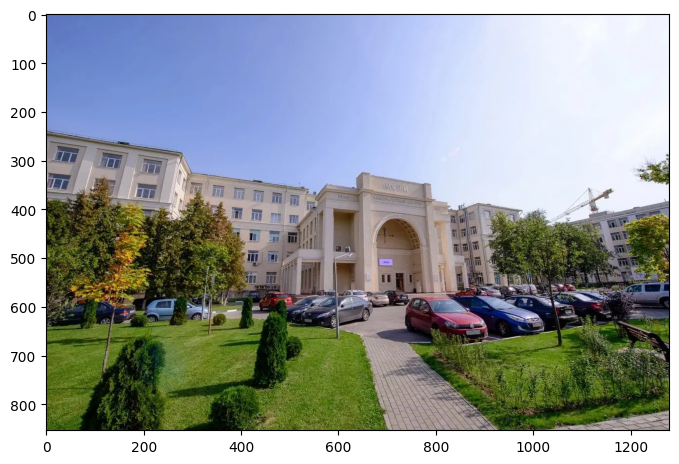

In [24]:
plt.imshow(img)
plt.show()

In [25]:
img_dark_sky = img.copy()
img_dark_sky[..., 2] -= 100

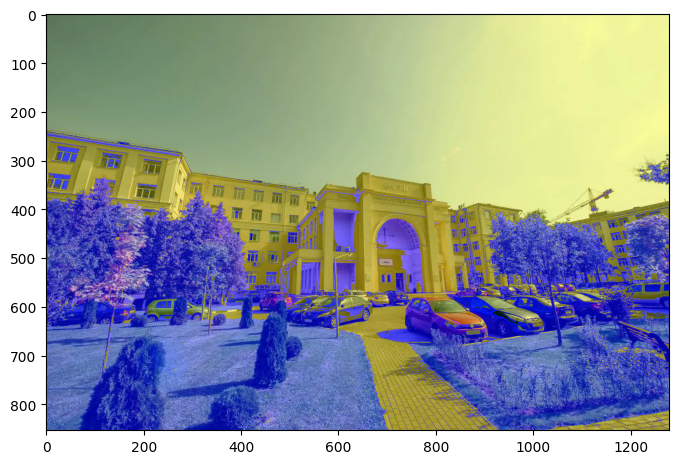

In [26]:
plt.imshow(img_dark_sky)
plt.show()

---

Давайте лучше будем работать в `float32` в диапазоне $\left[0.0;\;1.0\right]$

In [27]:
img_f32 = img.astype(np.float32) / 255

In [28]:
[img_f32.dtype, img_f32.shape]

[dtype('float32'), (854, 1280, 3)]

In [29]:
[img_f32.min(), img_f32.mean(), img_f32.max()]

[np.float32(0.0), np.float32(0.5309234), np.float32(1.0)]

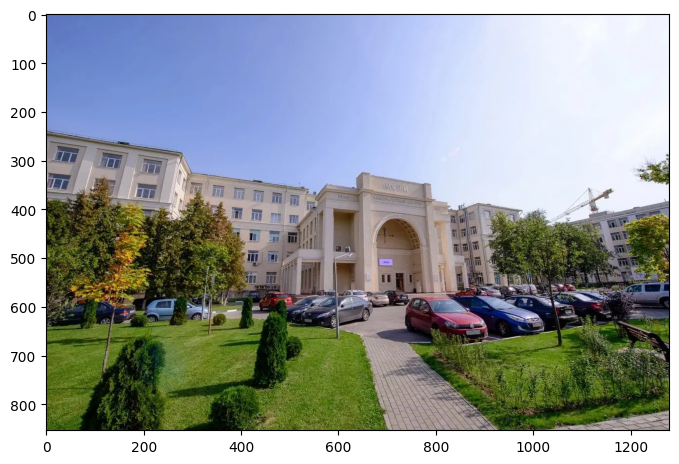

In [30]:
plt.imshow(img_f32)
plt.show()

In [31]:
img_dark_sky_f32 = img_f32.copy()
img_dark_sky_f32[..., 2] -= 100 / 255
img_dark_sky_f32 = img_dark_sky_f32.clip(0, None)

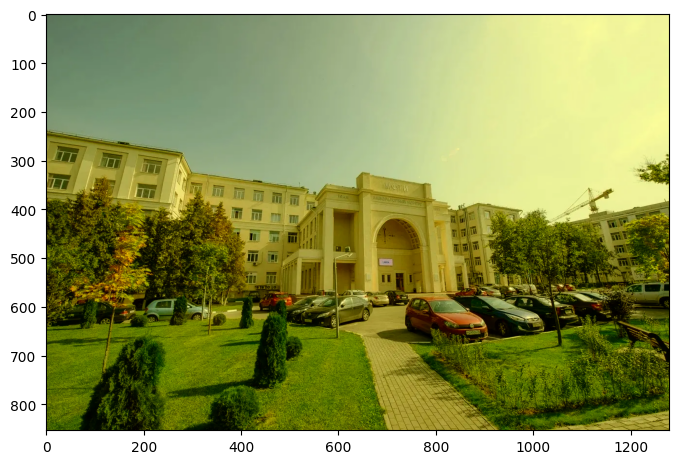

In [32]:
plt.imshow(img_dark_sky_f32)
plt.show()

---

Сконвертируем изображение в черно-белое

In [33]:
gray_f32 = rgb2gray(img_f32)

In [34]:
[gray_f32.dtype, gray_f32.shape]

[dtype('float32'), (854, 1280)]

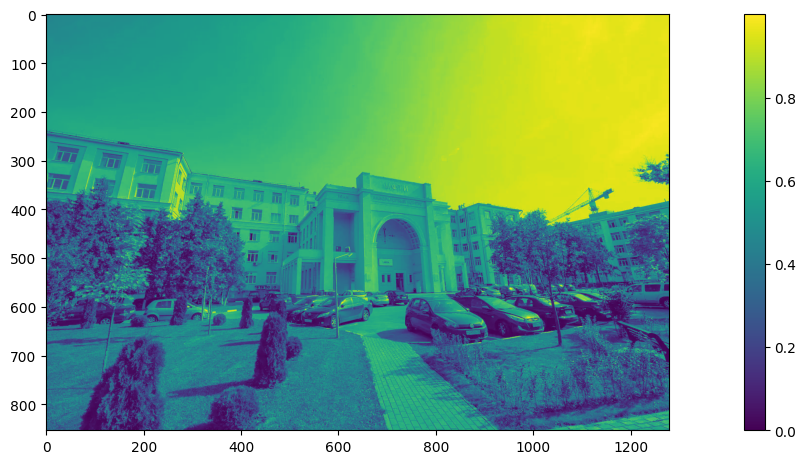

In [35]:
plt.imshow(gray_f32)
plt.colorbar()
plt.show()


Давайте попробуем сохранить картинку и посмотреть на неё без `matplotlib`.

In [38]:
mipt_gray_u8 = (gray_f32*255).astype(np.uint8)

imsave("mipt_gray.png", mipt_gray_u8)

imsave("mipt_gray.png", mipt_gray_u8)

Откроем сохраненный файл.

---

Исправим проблему

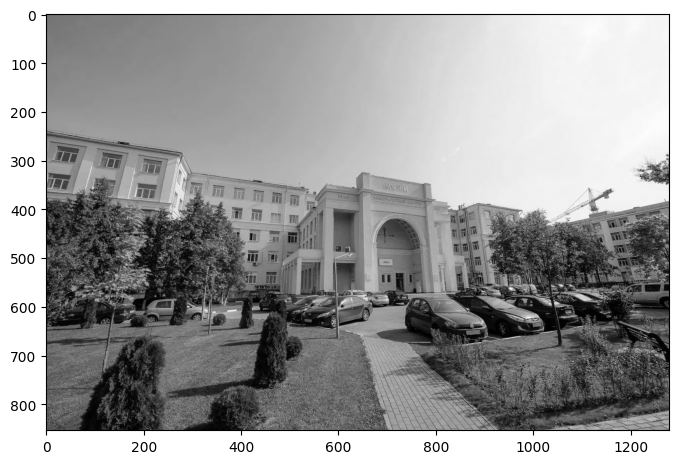

In [39]:
plt.imshow(gray_f32, cmap="gray")
plt.show()

---

Давайте сконвертируем в черно-белое изображение сами

In [40]:
simple_manual_gray_f32 = img_f32.mean(axis=-1)

In [41]:
[simple_manual_gray_f32.dtype, simple_manual_gray_f32.shape]

[dtype('float32'), (854, 1280)]

И сравним с библиотечным

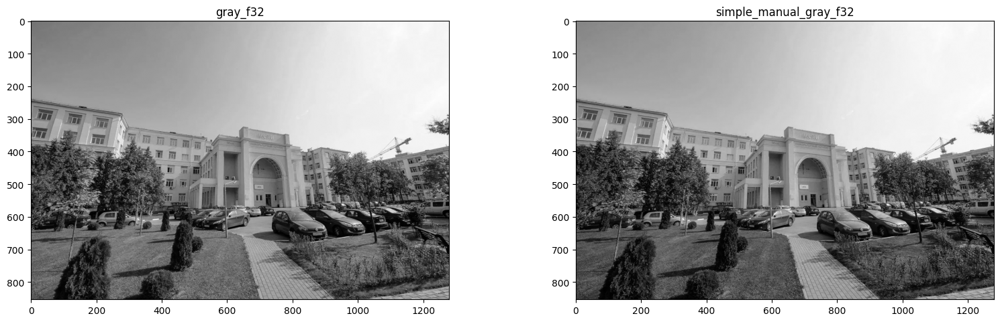

In [42]:
plt.subplot(1, 2, 1)
plt.imshow(gray_f32, cmap="gray")
plt.title("gray_f32")

plt.subplot(1, 2, 2)
plt.imshow(simple_manual_gray_f32, cmap="gray")
plt.title("simple_manual_gray_f32")

plt.show()

In [43]:
abs(simple_manual_gray_f32 - gray_f32).max()

np.float32(0.15131086)

Хм. Давайте посмотрим, что говорят в документации библиотечной версии.

In [44]:
help(rgb2gray)

Help on function rgb2gray in module skimage.color.colorconv:

rgb2gray(rgb, *, channel_axis=-1)
    Compute luminance of an RGB image.
    
    Parameters
    ----------
    rgb : (..., C=3, ...) array_like
        The image in RGB format. By default, the final dimension denotes
        channels.
    
    Returns
    -------
    out : ndarray
        The luminance image - an array which is the same size as the input
        array, but with the channel dimension removed.
    
    Raises
    ------
    ValueError
        If `rgb` is not at least 2-D with shape (..., C=3, ...).
    
    Notes
    -----
    The weights used in this conversion are calibrated for contemporary
    CRT phosphors::
    
        Y = 0.2125 R + 0.7154 G + 0.0721 B
    
    If there is an alpha channel present, it is ignored.
    
    References
    ----------
    .. [1] http://poynton.ca/PDFs/ColorFAQ.pdf
    
    Examples
    --------
    >>> from skimage.color import rgb2gray
    >>> from skimage import data
  

In [45]:
R, G, B = img_f32.transpose(2, 0, 1)
crt_luminance_f32 = 0.2125 * R + 0.7154 * G + 0.0721 * B

In [46]:
[crt_luminance_f32.dtype, crt_luminance_f32.shape]

[dtype('float32'), (854, 1280)]

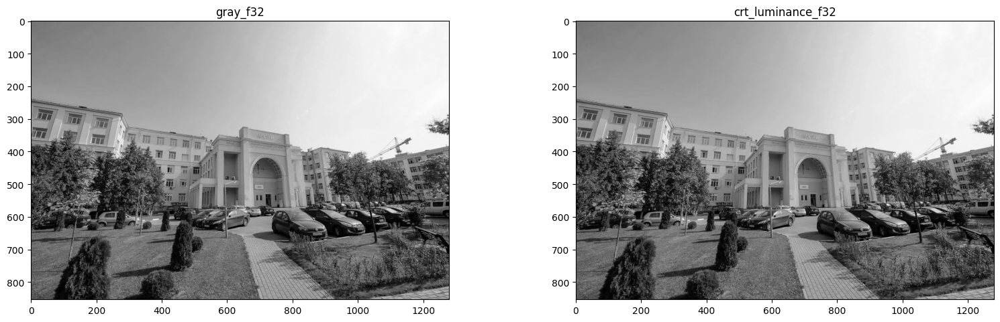

In [47]:
plt.subplot(1, 2, 1)
plt.imshow(gray_f32, cmap="gray")
plt.title("gray_f32")

plt.subplot(1, 2, 2)
plt.imshow(crt_luminance_f32, cmap="gray")
plt.title("crt_luminance_f32")

plt.show()

In [48]:
abs(crt_luminance_f32 - gray_f32).max()

np.float32(0.0)

### Работа с гистограммой изображения

Гистограмма изображения позволяет оценить количество и разнообразие оттенков, а также общий уровень яркости. Гистограмма изображения не описывает художественных качеств, но с её помощью можно рассчитывать разные статистики в картинке. Например найти миниум, максимум, среднее, медиану.

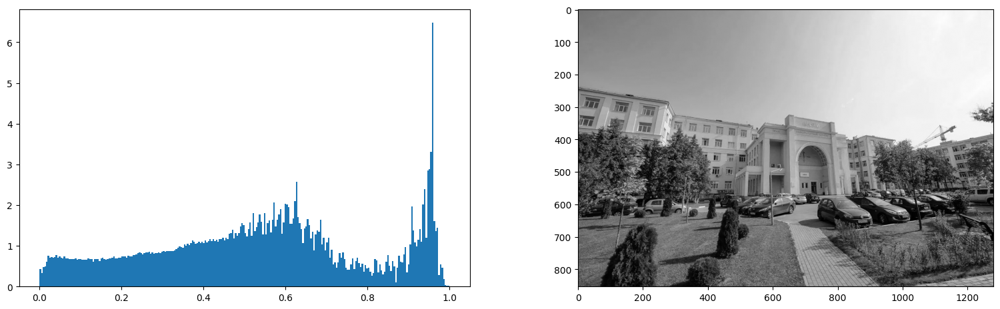

In [49]:
def plot_image_with_hist(image):
    # flatten image cause in image's histogram
    # there is no need to keep geometric information
    values = image.flatten()

    plt.subplot(1, 2, 1)
    # plot the histogram
    plt.hist(values, bins=256, range=(0, 1), density=True)

    plt.subplot(1, 2, 2)
    # show the image
    plt.imshow(image, cmap="gray", vmin=0, vmax=1)
    # image = np.repeat(image[..., None], 3, axis=-1)
    # plt.imshow(image)


plot_image_with_hist(gray_f32)

Самым простым видом трансформаций цветовых компотент изображений являются точечные операторы, которые изменяют каждый пиксель независимо. Например понизить яркость картинки можно поделив каждый пиксель на константу.

$$ value = value\ /\ 3 $$

Реализуем это преобразование и посмотрим на результат

In [50]:
darkened_f32 = gray_f32 / 3

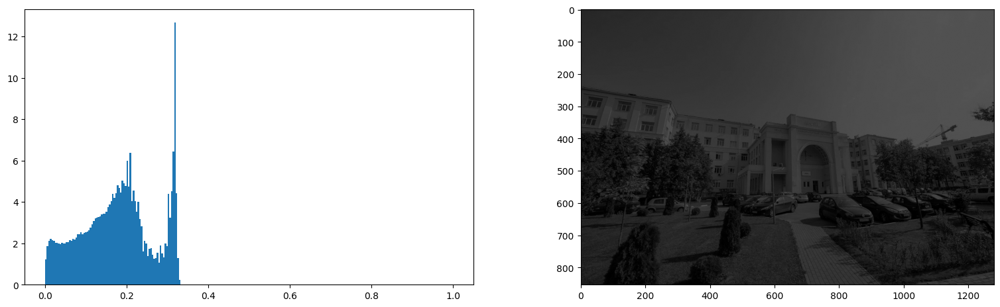

In [51]:
plot_image_with_hist(darkened_f32)

In [52]:
darkened_u8 = (255 * darkened_f32).clip(0, 255).round().astype(np.uint8)
darkened_fp32 = darkened_u8.astype(np.float32) / 255
brigthened_fp32 = 3 * darkened_fp32

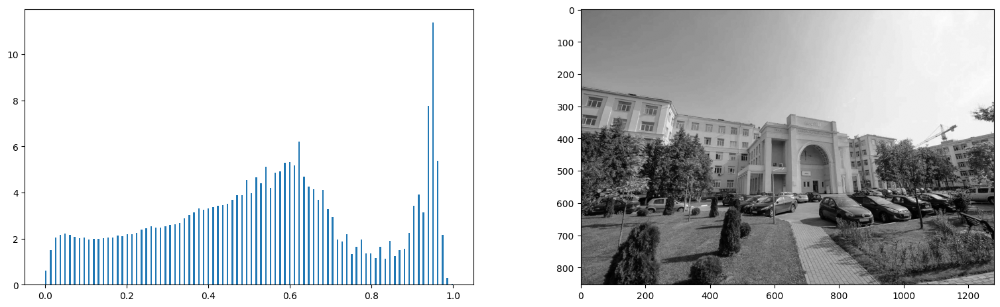

In [53]:
plot_image_with_hist(brigthened_fp32)

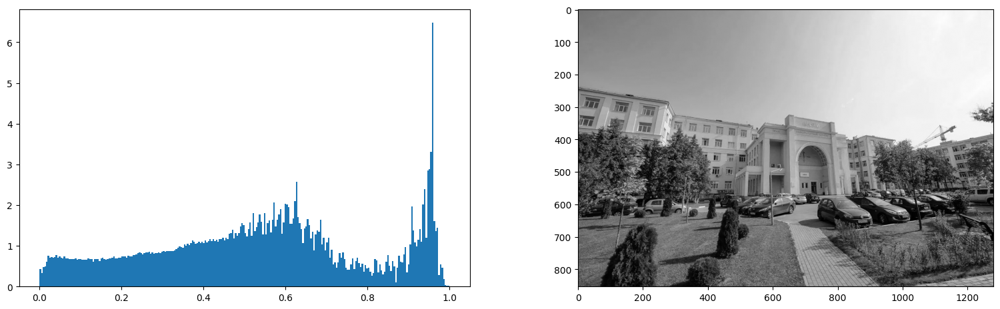

In [54]:
plot_image_with_hist(3 * darkened_f32)

---

#### Гамма-коррекция

Можно выделить общую форму для всех операторов преобразования изображений, как функцию от одной или более картинок, которая отображает аргументы в итоговую картинку.

$$ y = g(x_{0}, x_{1}, ..., x_{n}) $$

Так например, гамма коррекция задается формулой

$$ y = g(x) = x^{\gamma} $$

Во времена черно-белых телевизоров фосфор в электронно-лучевых трубках нелинейно реагировал на входное напряжение. Отношение между входным напряжением и получающейся яркостью можно было описать гаммой $ \gamma $, поскольку с грубой оценкой выполнялось $$ brightness = voltage^{\gamma}. $$ Где $ \gamma = 2.2 $.
Чтобы обратить этот эффект телевизоры перед подачей кадра обрабатывали его через $$ Y' = Y^{\frac{1}{\gamma}}, $$
$$ \dfrac{1}{\gamma} = 0.45. $$


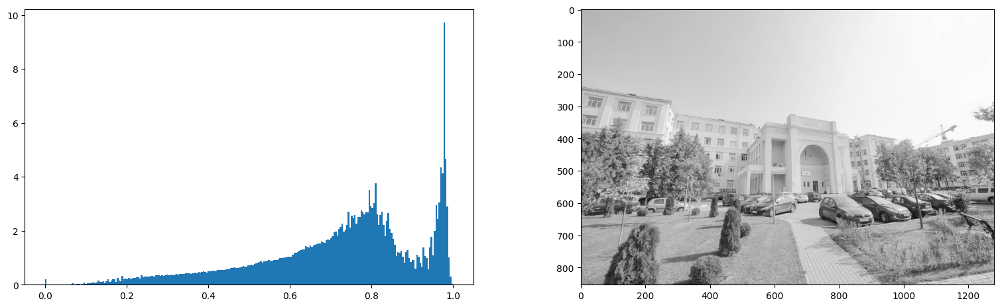

In [55]:
gamma = 1 / 2.2

gamma_correction = gray_f32**gamma

plot_image_with_hist(gamma_correction)

#### Линейное контрастирование

$$ y = g(x) = \frac{x - x_{min}}{x_{max} - x_{min}} $$

Используется чтобы повысить контрастность изображения за счет растяжения диапазона яркостей

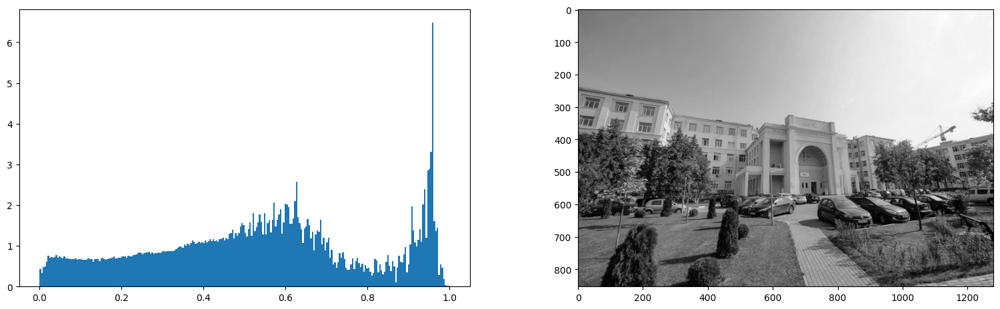

In [56]:
lin_stretch_img = gray_f32 - gray_f32.min()
lin_stretch_img = lin_stretch_img / lin_stretch_img.max()

plot_image_with_hist(lin_stretch_img)

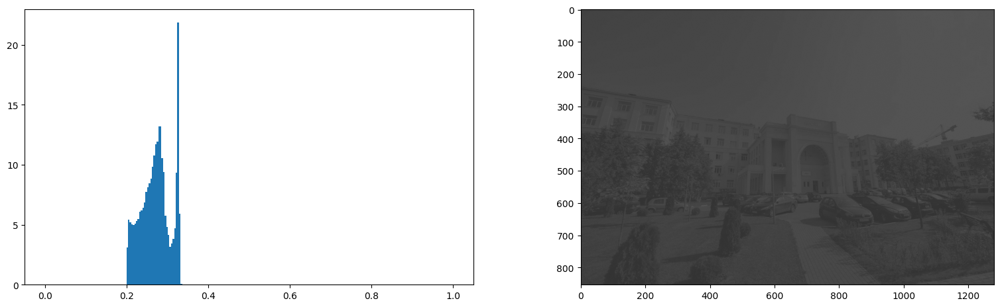

In [57]:
a, b = 0.2, 0.6
darkened_f32zip = darkened_f32 * (b - a) + a
plot_image_with_hist(darkened_f32zip)



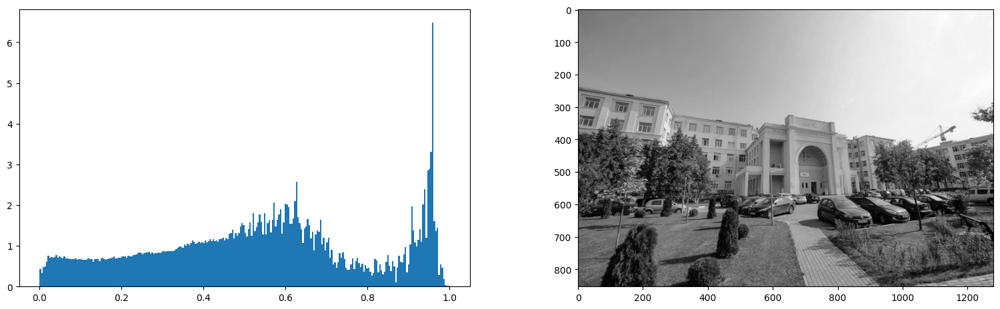

In [58]:
lin_stretch_img = darkened_f32zip - darkened_f32zip.min()
lin_stretch_img /= lin_stretch_img.max()
plot_image_with_hist(lin_stretch_img)

Как ещё мы можем повысить контрастность изображения? Чтобы сгладить резкие углы, используется эквивализация гистограммы. Алгоритм для выравнивания гистограммы цветов.

### Histogram equalization

Как найти такое преобразование? Трюк тот же, что и при сэмплировании случайных чисел для разнообразных распределений с использованием функции распределения $F(x)$. Ответом является отображение значений пикселей в соответствующие им квантили.


Алгоритм:
1. Посчитать гистограмму цветов h
2. Посчитать префиксные суммы массива h, оно и есть CDF(cumulative distribution function) цветов картинки
3. Чтобы получить картинку с линеаризованной CDF используем трансформацию пикселов по правилу: $ y = CDF(x) $, чтобы получить квантиль для исходного значения пикселя x.

Подробнее об алгоритме можно почитать на wiki [Histogram_equalization](https://en.wikipedia.org/wiki/Histogram_equalization#Implementation)

In [59]:
def calculate_cdf(gray_image):
    hist, _ = np.histogram(gray_image, bins=256, range=(0, 1), density=True)
    cdf = np.cumsum(hist) / 256
    return cdf


def hist_equalization(gray_image):
    cdf = calculate_cdf(gray_image)

    # map all values to cdf's values
    # cdf(gray_image)
    gray_image = np.interp(gray_image, np.linspace(0, 1, 256), cdf)

    return gray_image

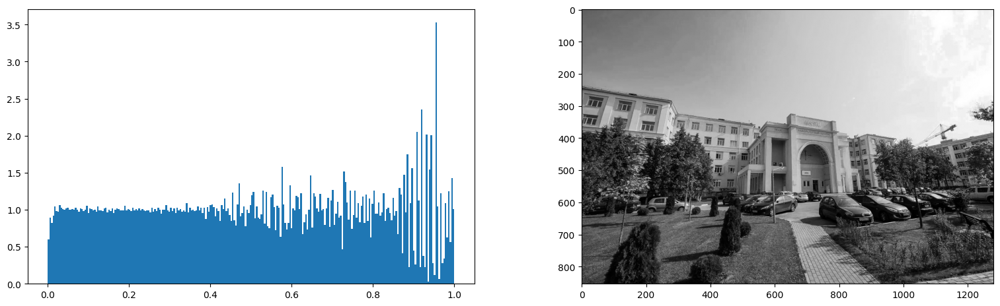

In [60]:
he_f32 = hist_equalization(gray_f32)

plot_image_with_hist(he_f32)

In [61]:
def plot_compare(images, names):
    for idx, (img, title) in enumerate(zip(images, names, strict=True)):
        plt.subplot(1, len(images), idx + 1)
        if img.ndim != 3:
            img = np.repeat(img[..., None], 3, axis=-1)
        plt.imshow(img)
        plt.title(title)
        plt.axis("off")

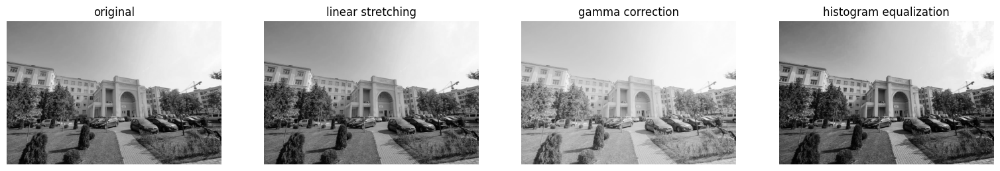

In [62]:
images = [gray_f32, lin_stretch_img, gamma_correction, he_f32]
names = ["original", "linear stretching", "gamma correction", "histogram equalization"]

plot_compare(images, names)

### Locally adaptive histogram equalization

Глобальная гистограмма цветов может быть очень полезной, но в то же время для некоторых картинок предпочтительней применить различного вида эквивализации к разным регионам. Добиться этого можно с помощью разбиения картинки на блоки размера $(M, M)$ и применить $HE$ независимо для каждого блока. Если блоки будут не пересекаться, то в картинке могут появиться артефакты.

In [63]:
def naive_lahe_filt(image, block_size=32):
    # for simplicity, lets crop the image to a multiple of the block size
    ylen = image.shape[0] // block_size
    xlen = image.shape[1] // block_size
    image = image[: ylen * block_size, : xlen * block_size]

    new_image = np.zeros_like(image)

    for i in range(ylen):
        y = block_size * i
        for j in range(xlen):
            x = block_size * j

            # Extract the block
            block = image[y : y + block_size, x : x + block_size]

            # Equalize histogram for this block
            block = hist_equalization(block)

            # Write the block back
            new_image[y : y + block_size, x : x + block_size] = block

    return new_image

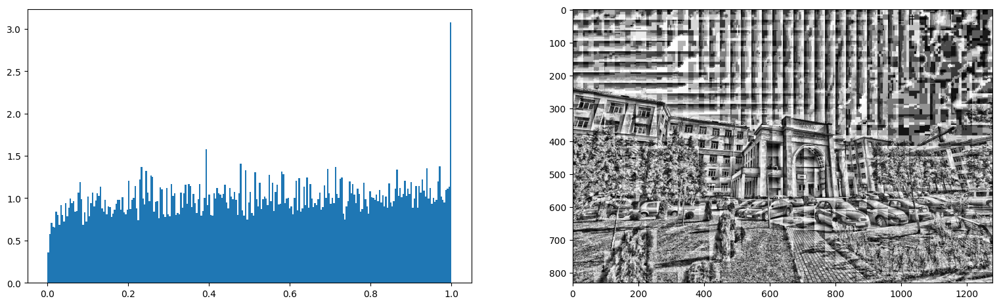

In [64]:
naive_lahe_f32 = naive_lahe_filt(gray_f32)

plot_image_with_hist(naive_lahe_f32)

Чтобы избежать таких артефактов, можно использовать движущееся окно, а именно рассчитывать гистограммы для каждого блока $(M, M)$ и менять значение только в его центре.

Давайте реализуем алгоритм через наш обобщенный алгоритм фильтрации.

### Фильтрация изображений

![](https://code.mipt.ru/courses-public/cv/storage/-/raw/seminars/basic-image-processing/filt.png)

Фильтрацией изображений называют преобразование пикселей изображений с учетом региона определенной формы.

$$ g(x)_{ij} = k\left(x_{\mathrm{region}\left(i,\, j\right)}\right)$$

Функция $k$ применяется к каждому региону изображения и называется ядром фильтра.

Давайте реализуем обобщенный алгоритм для фильтрации изображений

In [65]:
def filt(image, kernel, *, kernel_size=3, padd=0, fill_mode="reflect"):
    """
    kernel - arbitrary function with one argument - window
    fill_mode - 'constant', 'symmetric', 'reflect'
    """
    if padd:
        padding = [(padd, padd), (padd, padd)]
        if image.ndim == 3:
            padding += [(0, 0)]

        # use np.pad for image padding
        image = np.pad(image, padding, mode=fill_mode)

    h_range = range(image.shape[0] - (kernel_size - 1))
    w_range = range(image.shape[1] - (kernel_size - 1))
    channels = image.shape[-1:] if image.ndim == 3 else ()

    # define new image
    new_image = np.empty((len(h_range), len(w_range)) + channels, dtype=image.dtype)

    for i in tqdm(h_range, total=len(h_range)):
        for j in w_range:
            # define image slice - window
            window = image[i : i + kernel_size, j : j + kernel_size]

            # apply kernel to window
            value = kernel(window)

            # write out the result
            new_image[i, j] = value

    return new_image

In [66]:
def lahe_kernel(window):
    h, w = window.shape[:2]

    # calculate cdf of image's color histogram
    cdf = calculate_cdf(window)

    # extract the middle pixel from the window
    center = window[h // 2, w // 2]

    # map only the extracted value using the whole cdf
    value = np.interp(center, np.linspace(0, 1, 256), cdf)

    return value

100%|██████████| 854/854 [02:19<00:00,  6.11it/s]


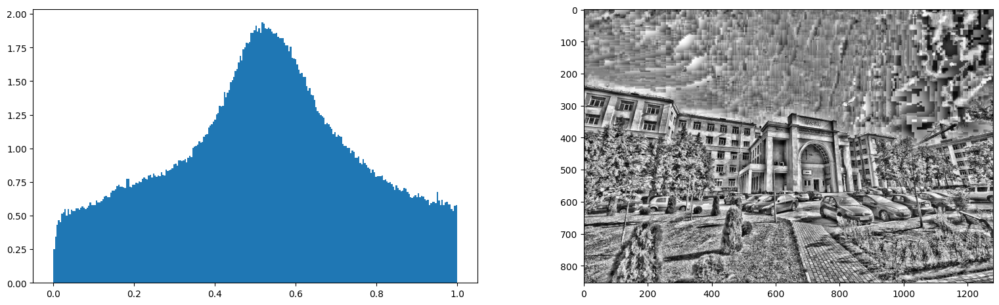

In [67]:
lahe_f32 = filt(gray_f32, lahe_kernel, kernel_size=51, padd=25, fill_mode="reflect")
plot_image_with_hist(lahe_f32)

### Шум

Цифровой шум - это дефект изображения, вносимый фотосенсорами и электроникой устройств(как черно-белые телевизоры портили нам яркость) из-за несовершенства технологий или фотонной природы света. Некоторые виды шумов можно промоделировать и использовать для контроля качества алгоритмов понижения уровня шума на картинке. Например, гауссовским шумом на изображении называется колебание яркости распределенное по нормальному закону.

### Drop-out noise

Или по-другому потеря информации. Соль и перец - случайные черные и белые пиксели. Импульсный тип - точки высвечиваются белым

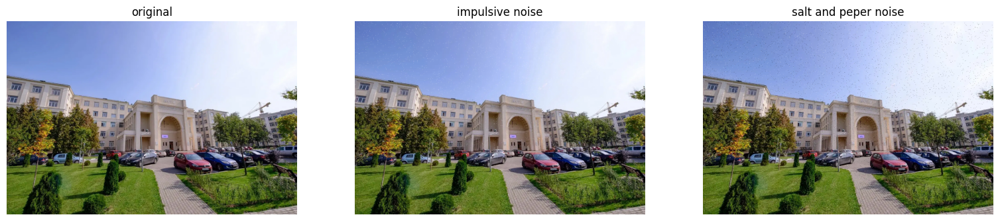

In [68]:
def sample_idx(h, w, count=500):
    y = np.random.randint(h, size=count)
    x = np.random.randint(w, size=count)
    return y, x


def dropout_values(image, val, count=500):
    image = image.copy()
    random_coords = sample_idx(*image.shape[:2], count=count)
    image[random_coords] = val
    return image


def salt_pepper(image, count=5000):
    # random white and black pixels
    image = dropout_values(image, 1, count=count)
    image = dropout_values(image, 0, count=count)
    return image


# only white pixels
impulsive_f32 = dropout_values(img_f32, 1, count=5000)
# plus dark
salt_peper_f32 = salt_pepper(img_f32)

images = [img_f32, impulsive_f32, salt_peper_f32]
names = ["original", "impulsive noise", "salt and peper noise"]

plot_compare(images, names)

### Median filter

Медианный фильт - один из нелинейных фильтров, используемых для уменьшения уровня шума в изображении. Результатом преобразования одного региона является медиана его чисел.

In [69]:
def median_filter(window):
    channels = window.shape[-1:] if window.ndim == 3 else ()

    # sort values
    values = window.copy().reshape((-1,) + channels)
    values.sort(axis=0)

    # choose mid value
    median = np.median(window, axis=(0, 1))
    # middle, odd = divmod(values.shape[0], 2)
    # median = values[middle - (not odd) : middle + 1].mean(axis=0)

    return median

100%|██████████| 854/854 [00:44<00:00, 19.26it/s]


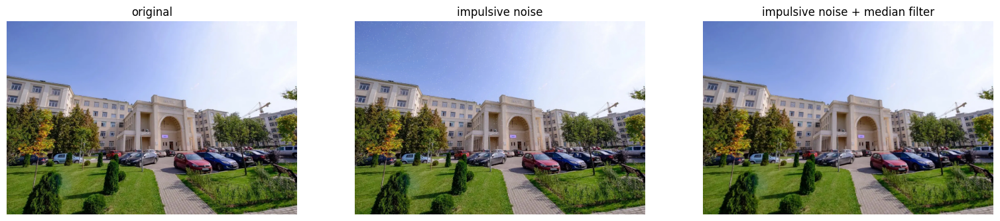

100%|██████████| 854/854 [00:44<00:00, 19.38it/s]


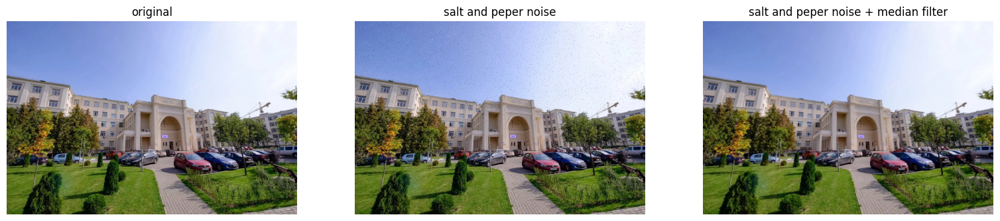

In [70]:
for name, noise in [
    ("impulsive noise", impulsive_f32),
    ("salt and peper noise", salt_peper_f32),
]:
    images = [img_f32, noise, filt(noise, median_filter, kernel_size=3, padd=1)]
    names = ["original", name, f"{name} + median filter"]

    plot_compare(images, names)
    plt.show()

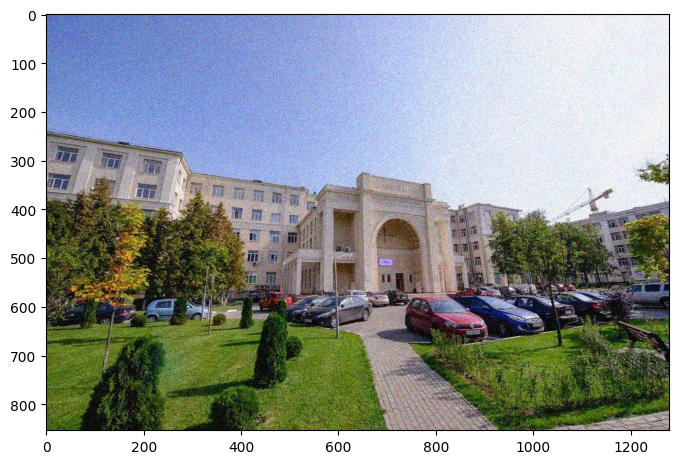

In [71]:
noisy_f32 = (img_f32 + np.random.randn(*img_f32.shape) * 0.1).clip(0, 1)
plt.imshow(noisy_f32)
plt.show()

100%|██████████| 854/854 [00:41<00:00, 20.46it/s]


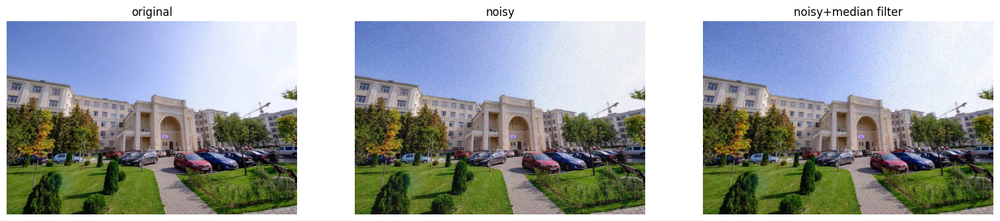

In [72]:
images = [img_f32, noisy_f32, filt(noisy_f32, median_filter, kernel_size=3, padd=1)]
names = ["original", "noisy", "noisy+median filter"]


plot_compare(images, names)

In [ ]:
from skimage.filters import gaussian

images = [img_f32, noisy_f32, gaussian(noisy_f32, sigma=1, channel_axis=-1)]
names = ["original", "noisy", "noisy+gausian filter"]


plot_compare(images, names)

### Границы объектов

Основной целью обнаружения резких изменений яркости изображения является фиксация важных событий и изменений мира. Они могут отражать различные предположения о модели формирования изображения, изменения в яркости изображения могут указывать на:

> изменения глубины;

> изменения ориентации поверхностей;

> изменения в свойствах материала;

> различие в освещении сцены.

В идеальном случае результатом выделения границ является набор связанных кривых, обозначающих границы объектов. Таким образом, применение фильтра выделения границ к изображению может существенно уменьшить количество обрабатываемых данных из-за того, что отфильтрованная часть изображения считается менее значимой, а наиболее важные структурные свойства изображения сохраняются.

Один из самых простых методов выделения границ - оператор Собеля.

![](https://code.mipt.ru/courses-public/cv/storage/-/raw/seminars/basic-image-processing/sobel.png)


![](https://code.mipt.ru/courses-public/cv/storage/-/raw/seminars/basic-image-processing/grad_norm.png)

In [73]:
sobel_kernel = np.array([[1.0, 2.0, 1.0], [0.0, 0.0, 0.0], [-1.0, -2.0, -1.0]])


def sobel_x(window):
    return (window * sobel_kernel).sum()


def sobel_y(window):
    return (window * sobel_kernel.T).sum()

In [74]:
def sobel(gray_image):
    der_x = filt(gray_image, sobel_x, kernel_size=3, padd=1, fill_mode="reflect")
    der_y = filt(gray_image, sobel_y, kernel_size=3, padd=1, fill_mode="reflect")

    edge = np.sqrt(der_x**2 + der_y**2)
    return edge

  0%|          | 0/854 [00:00<?, ?it/s]

100%|██████████| 854/854 [00:04<00:00, 203.78it/s]


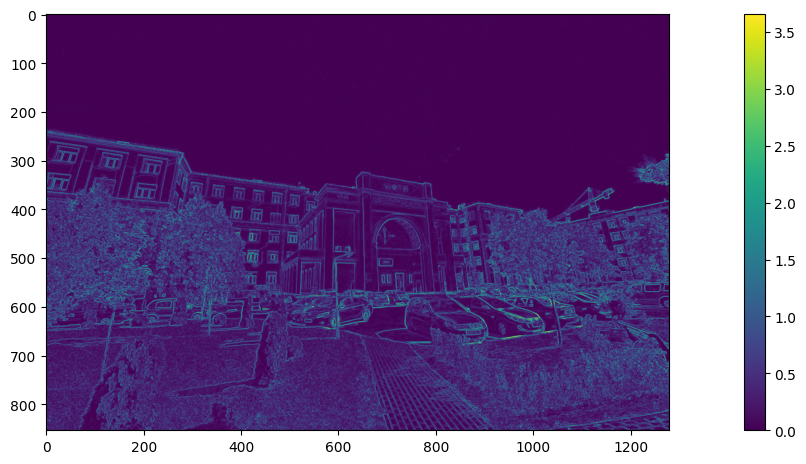

In [75]:
edge = sobel(gray_f32)

plt.imshow(edge)
plt.colorbar()
plt.show()

### Max filter

In [ ]:
def max_filter(window):
    # return max-value among height and width
    return np.max(window, axis=(0, 1))

100%|██████████| 854/854 [00:05<00:00, 168.21it/s]


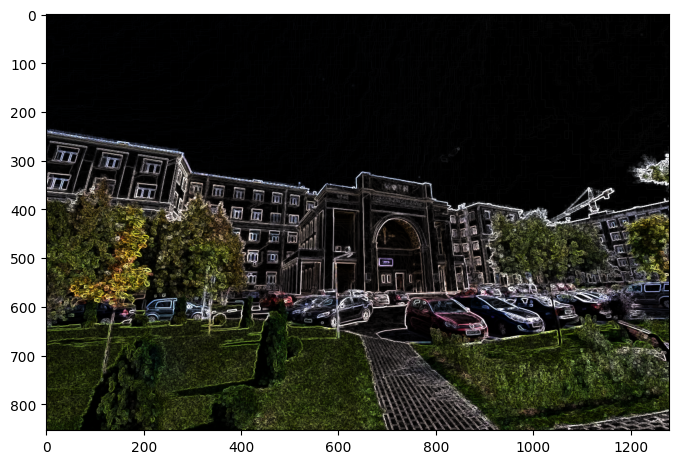

In [ ]:

median_f32 = filt(img_f32, median_filter, kernel_size=5, padd=2)
max_f32 = filt(median_f32, max_filter, kernel_size=5, padd=2)

res = (edge[:, :, None] * max_f32).clip(0, 1)

plt.imshow(res)
plt.show()